In [2]:
import os
import glob
# 위에까지 경로지정.
import numpy as np
import datetime
import matplotlib.pyplot as plt
from PIL import Image # 이미지 파일 시각화.
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
from torch.autograd import Variable # 미분하는 거. 요새는 그냥 내장되어 있어서 굳이 안씀.
from torch.utils.data import Dataset, DataLoader
import zipfile
from google.colab import files

In [3]:
file_path = '/content/drive/MyDrive/GAN 실습/improved_color_images.zip'

# 컬러 폴더 압축 해제
with zipfile.ZipFile(file_path, 'r') as zip_ref:
    zip_ref.extractall('improved_color_folder')

print(os.listdir('improved_color_folder'))

['image_378.png', 'image_116.png', 'image_40.png', 'image_384.png', 'image_24.png', 'image_397.png', 'image_226.png', 'image_200.png', 'image_485.png', 'image_534.png', 'image_234.png', 'image_28.png', 'image_499.png', 'image_494.png', 'image_415.png', 'image_426.png', 'image_465.png', 'image_478.png', 'image_392.png', 'image_266.png', 'image_370.png', 'image_464.png', 'image_220.png', 'image_542.png', 'image_403.png', 'image_136.png', 'image_459.png', 'image_424.png', 'image_208.png', 'image_157.png', 'image_502.png', 'image_44.png', 'image_199.png', 'image_488.png', 'image_142.png', 'image_311.png', 'image_213.png', 'image_327.png', 'image_437.png', 'image_414.png', 'image_182.png', 'image_268.png', 'image_127.png', 'image_230.png', 'image_472.png', 'image_119.png', 'image_154.png', 'image_346.png', 'image_377.png', 'image_448.png', 'image_473.png', 'image_186.png', 'image_514.png', 'image_310.png', 'image_351.png', 'image_460.png', 'image_498.png', 'image_373.png', 'image_155.png', 

In [4]:
file_path = '/content/drive/MyDrive/GAN 실습/improved_gray_images.zip'

# gray 폴더 압축 해제
with zipfile.ZipFile(file_path, 'r') as zip_ref:
    zip_ref.extractall('improved_gray_folder')

print(os.listdir('improved_gray_folder'))

['image_69.png', 'image_872.png', 'image_884.png', 'image_82.png', 'image_935.png', 'image_66.png', 'image_981.png', 'image_631.png', 'image_907.png', 'image_991.png', 'image_734.png', 'image_690.png', 'image_85.png', 'image_668.png', 'image_740.png', 'image_927.png', 'image_604.png', 'image_911.png', 'image_793.png', 'image_860.png', 'image_728.png', 'image_890.png', 'image_571.png', 'image_938.png', 'image_746.png', 'image_569.png', 'image_92.png', 'image_996.png', 'image_959.png', 'image_663.png', 'image_968.png', 'image_748.png', 'image_823.png', 'image_780.png', 'image_882.png', 'image_666.png', 'image_595.png', 'image_789.png', 'image_932.png', 'image_638.png', 'image_926.png', 'image_91.png', 'image_985.png', 'image_769.png', 'image_745.png', 'image_621.png', 'image_9.png', 'image_851.png', 'image_982.png', 'image_804.png', 'image_837.png', 'image_90.png', 'image_931.png', 'image_847.png', 'image_622.png', 'image_768.png', 'image_810.png', 'image_821.png', 'image_956.png', 'imag

In [5]:
file_path = '/content/drive/MyDrive/GAN 실습/improved_test_images.zip'

# test 폴더 압축 해제
with zipfile.ZipFile(file_path, 'r') as zip_ref:
    zip_ref.extractall('improved_test_folder')

print(os.listdir('improved_test_folder'))

['gray', 'color']


In [24]:
class VictorianDataset(Dataset):
  def __init__(self, root, color_transforms_ = None, gray_transforms_ = None):

    self.color_transforms = transforms.Compose(color_transforms_)
    self.gray_transforms = transforms.Compose(gray_transforms_)
    self.gray_files = sorted(glob.glob(os.path.join('/content/improved_gray_folder') + '/*.*'))
    self.color_files = sorted(glob.glob(os.path.join('/content/improved_color_folder') + '/*.*'))


  def __getitem__(self, index):

    gray_img = Image.open(self.gray_files[index % len(self.gray_files)]).convert('L') # 흑백 이미지 convert로 1채널로 받아주고,
    color_img = Image.open(self.color_files[index % len(self.color_files)]).convert('RGB') # 컬러는 3채널 값으로.


    gray_img = self.gray_transforms(gray_img)
    color_img = self.color_transforms(color_img)


    return {'A' : gray_img, 'B': color_img}

  def __len__(self):

    return len(self.gray_files)

In [40]:
root = ''
test_root = root + 'test/'

img_height = 256
img_width = 256

batch_size = 12
test_batch_size = 6

gpu = 0

In [41]:
### 이전 코드 실습값 갖고 온거.
color_mean = [0.06107936, 0.05873202, 0.06731751]
color_std = [0.24714239, 0.24234689, 0.25945618]
gray_mean = [0.05931176]
gray_std = [0.24354007]


color_transforms_ = [
    transforms.Resize(size = (img_height, img_width)),
    transforms.ToTensor(),
    transforms.Normalize(mean = color_mean, std = color_std),
]

gray_transforms_ = [
    transforms.Resize(size = (img_height, img_width)),
    transforms.ToTensor(),
    transforms.Normalize(mean = gray_mean, std = gray_std),
]

In [42]:
### train 로더

train_loader = DataLoader(
    VictorianDataset(root, color_transforms_ = color_transforms_, gray_transforms_ = gray_transforms_),
    batch_size = batch_size,
    shuffle = True
)

In [43]:
### 데이터 잘 되어있는지 확인 작업.

def reNormalize(img, mean, std):
  img = img.numpy().transpose(1, 2, 0)
  img = img * std + mean
  img = img.clip(0, 1)

  return img

torch.Size([12, 1, 256, 256]) torch.Size([12, 3, 256, 256])


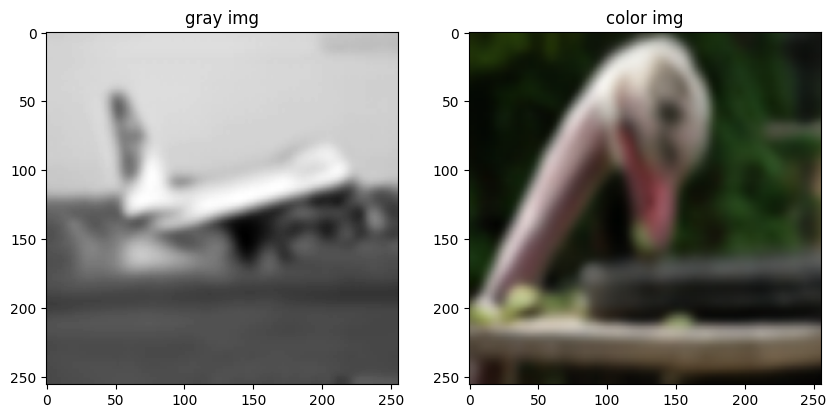

In [44]:
fig = plt.figure(figsize = (10, 5))
rows = 1
cols = 2

for X in train_loader:

  print(X['A'].shape, X['B'].shape)

  ax1 = fig.add_subplot(rows, cols, 1)
  ax1.imshow(reNormalize(X['A'][0], gray_mean, gray_std).reshape(img_height, img_width), cmap = 'gray')
  ax1.set_title('gray img')

  ax2 = fig.add_subplot(rows, cols, 2)
  ax2.imshow(reNormalize(X['B'][0], color_mean, color_std))
  ax2.set_title('color img')

  plt.show()

  break

In [45]:
### test 로더

test_loader = DataLoader(
    VictorianDataset(test_root, color_transforms_= color_transforms_, gray_transforms_ = gray_transforms_),
    batch_size = test_batch_size,
    shuffle = False
)

torch.Size([6, 1, 256, 256]) torch.Size([6, 3, 256, 256])


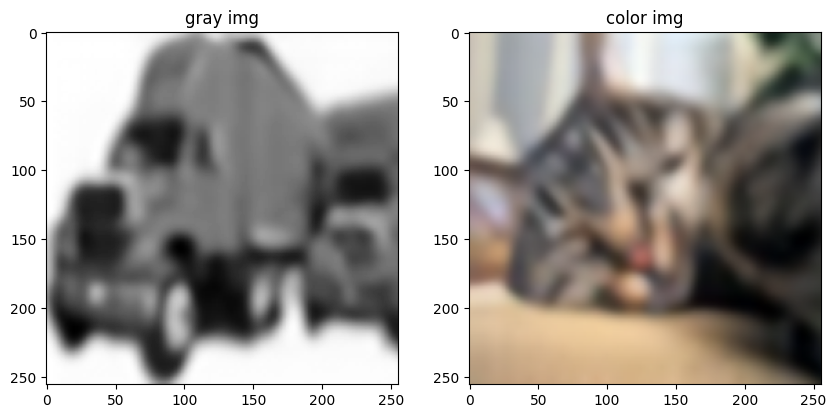

In [46]:
fig = plt.figure(figsize = (10, 5))
rows = 1
cols = 2

for X in test_loader:

  print(X['A'].shape, X['B'].shape)
  ax1 = fig.add_subplot(rows, cols, 1)
  ax1.imshow(reNormalize(X['A'][0], gray_mean, gray_std).reshape(img_height, img_width), cmap = 'gray')
  ax1.set_title('gray img')

  ax2 = fig.add_subplot(rows, cols, 2)
  ax2.imshow(reNormalize(X['B'][0], color_mean, color_std))
  ax2.set_title('color img')

  plt.show()

  break

In [47]:
##### GAN 모델 구축.

In [55]:
class Generator(nn.Module):
  def __init__(self):

    super(Generator, self).__init__()

    self.conv1 = nn.Sequential(
        nn.Conv2d(in_channels= 2, out_channels = 64, kernel_size = 3, stride = 1, padding = 1), ##
        nn.BatchNorm2d(64), # 출력 채널에 맞춰서.
        nn.LeakyReLU(0.1), # LeakyReLU가 입력값이 0보다 크면, 그대로, 0보다 작음 0.1 곱해서. 그래프 떠올려보자.
    )

    self.maxpool = nn.MaxPool2d(2, 2)


    self.conv2 = nn.Sequential(
        nn.Conv2d(in_channels = 64, out_channels = 64 * 2, kernel_size = 3, stride = 1, padding = 1),
        nn.BatchNorm2d(64 * 2),
        nn.LeakyReLU(0.1)
    )

    self.upsample = nn.Sequential(
        nn.ConvTranspose2d(in_channels = 64 * 2, out_channels = 64, kernel_size = 4, stride = 2, padding = 1),
        nn.BatchNorm2d(64),
        nn.LeakyReLU(0.2)
    )

    self.conv1by1 = nn.Sequential(
        nn.Conv2d(in_channels = 64, out_channels = 64, kernel_size = 1, stride = 1, padding = 0),
        nn.BatchNorm2d(64),
        nn.LeakyReLU(0.1)
    )

    self.conv = nn.Sequential(
        nn.Conv2d(in_channels = 64, out_channels = 3, kernel_size = 3, stride = 1, padding = 1),
        nn.Tanh()
    )

  def forward(self, input):
    output1 = self.conv1(input)

    pool1 = self.maxpool(output1)
    output2 = self.conv2(pool1)
    output3 = self.upsample(output2) + output1
    output4 = self.conv1by1(output3)

    out = self.conv(output4)

    return out

In [56]:
class Discriminator(nn.Module):
  def __init__(self):

    super(Discriminator, self).__init__()

    self.main = nn.Sequential(
        nn.Conv2d(in_channels = 3, out_channels = 64, kernel_size = 4, stride = 2, padding = 1, bias = False), ### 전에 출력 채널값 3이니, 잘 맞춰서.
        nn.LeakyReLU(0.2, inplace = True), ## inplace 인자값. 원본 데이터 필요없음, True, 원본데이터 유지하고 새로 생성하려면 False, 메모리 사용량 True쓰면 더 줄어듦.


        nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 4, stride = 2, padding = 1, bias = False),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(0.2, inplace = True),

        nn.Conv2d(in_channels = 128, out_channels = 128, kernel_size = 1, stride = 1, padding = 0, bias = False), ### 여기서 Generator랑 다르게 bias값 False로 준건,
        nn.BatchNorm2d(128),
        nn.LeakyReLU(0.2, inplace = True),


        nn.Conv2d(in_channels = 128, out_channels = 256, kernel_size = 4, stride = 2, padding = 1, bias = False),
        nn.BatchNorm2d(256),
        nn.LeakyReLU(0.2, inplace = True),


        nn.Conv2d(in_channels = 256, out_channels = 512, kernel_size = 4, stride = 2, padding = 1, bias = False),
        nn.BatchNorm2d(512),
        nn.LeakyReLU(0.2, inplace = True),

        nn.Conv2d(in_channels = 512, out_channels = 1024, kernel_size = 4, stride = 2, padding = 1, bias = False),
        nn.BatchNorm2d(1024),
        nn.LeakyReLU(0.2, inplace = True),
       )


    self. fc = nn.Sequential(
        nn.Linear(1024 * 8 * 8, 1024),
        nn.LeakyReLU(0.2),
        nn.Linear(1024, 256),
        nn.LeakyReLU(0.2),
        nn.Linear(256, batch_size),
        nn.Sigmoid()
    )

  def forward(self, input, b_size):
    output = self.main(input)
    output = self.fc(output.view(b_size,- 1))

    return output

Bias는 보통 BatchNorm layer를 쌓으면 무의미 하다.

<br>

그래서 보통 BatchNorm을 Conv2 계층 뒤에 있음 bias = False라고 지정해주는데, 여기서는 신기하게 최적화 때문인지, 디자인 때문에 그런건지... 암튼 그렇다.




<br>
<br>
<br>



Discriminator에만 FC 있는게 어떤 확률값을 출력해야 한다. 이 확률값은 스칼라 값이고 2D에서 1D로 변환하는 과정이 필요.

In [57]:
def weights_init(m):
  classname = m.__class__.__name__ #클래스 이름 classname에 때려박는거.

  if classname.find('Conv') != -1:
    m.weight.data.normal_(0.0, 0.02)

  elif classname.find('BatchNorm') != -1:
    m.weight.data.normal_(1.0, 0.02)
    m.bias.data.fill_(0)

In [58]:
Gener = Generator().cuda(gpu) if torch.cuda.is_available() else Generator()
Gener.apply(weights_init)

Generator(
  (conv1): Sequential(
    (0): Conv2d(2, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.1)
  )
  (maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.1)
  )
  (upsample): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
  )
  (conv1by1): Sequential(
    (0): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(nega

In [59]:
Discri = Discriminator().cuda(gpu) if torch.cuda.is_available() else Discriminator()
Discri.apply(weights_init)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (12): BatchNorm2d(512, eps=1e-05, momentum=0.1, af

In [60]:
max_epoch = 50

optimizerD = torch.optim.Adam(Discri.parameters(), lr = 0.0002, betas = (0.5, 0.999))
optimizerG = torch.optim.Adam(Gener.parameters(), lr = 0.0002, betas = (0.5, 0.999))

betas가 Adam 최적화에 들어가는건데,

<br>

첫번째 0.5가 모멘텀 계산.
두번째 0.999가 RMSPorp에서 사용되는 기울기 지수 평균 계산.

보통 0.9에 가깝게, 0.999에 가깝게 설정.

[Epoch 5/50] [Batch 42/42] [Discriminator loss: 1.000000] [Generator loss: 0.083333] ETA: 0:00:24.911122


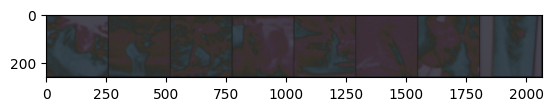

[Epoch 10/50] [Batch 42/42] [Discriminator loss: 1.000000] [Generator loss: 0.083333] ETA: 0:00:24.633838


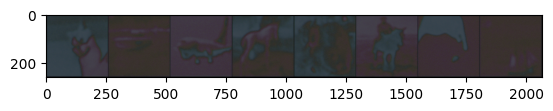

[Epoch 15/50] [Batch 42/42] [Discriminator loss: 0.959503] [Generator loss: 0.431107] ETA: 0:00:24.568477


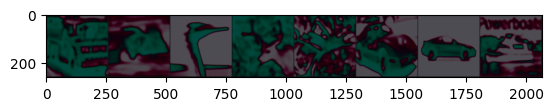

[Epoch 20/50] [Batch 42/42] [Discriminator loss: 0.139947] [Generator loss: 1.000000] ETA: 0:00:24.209360


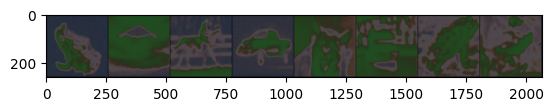

[Epoch 25/50] [Batch 42/42] [Discriminator loss: 0.983697] [Generator loss: 0.135417] ETA: 0:00:24.330630


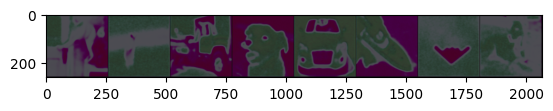

[Epoch 30/50] [Batch 42/42] [Discriminator loss: 0.543372] [Generator loss: 0.977813] ETA: 0:00:24.968972


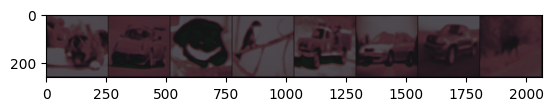

[Epoch 35/50] [Batch 42/42] [Discriminator loss: 0.770774] [Generator loss: 0.364583] ETA: 0:00:24.728747


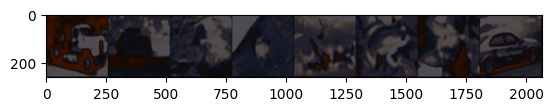

[Epoch 40/50] [Batch 42/42] [Discriminator loss: 0.535146] [Generator loss: 0.781250] ETA: 0:00:24.469180


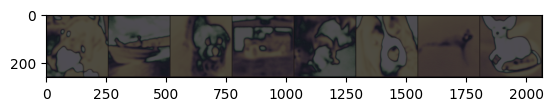

[Epoch 45/50] [Batch 42/42] [Discriminator loss: 0.000000] [Generator loss: 1.000000] ETA: 0:00:23.568042


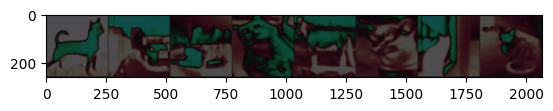

[Epoch 50/50] [Batch 42/42] [Discriminator loss: 0.079166] [Generator loss: 0.967960] ETA: 0:00:23.347016


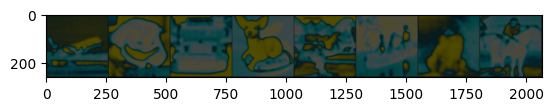

In [61]:
for epoch in range(max_epoch):
  start_time = datetime.datetime.now()
  loss_D = 0.0

  for i, data in enumerate(train_loader):
    grays, color = data['A'], data['B']
    b_size = len(data['A'])

    ### Generator 학습. noise막 껴넣는거 확인.
    noise = torch.randn(b_size, 1, img_height, img_width).uniform_(0, 1)
    gray_noise = Variable(torch.cat([grays, noise], dim = 1).cuda(gpu)) # 흑백 noise
    fake_img = Gener(gray_noise)
    output = Discri(fake_img, b_size)
    g_loss = torch.mean((output -1) ** 2)


    Discri.zero_grad()
    Gener.zero_grad()
    g_loss.backward()
    optimizerG.step()


    ### Discriminator 학습
    color = Variable(color.cuda(gpu))

    noise = torch.randn(b_size, 1, img_height, img_width).uniform_(0, 1) #
    gray_noise = Variable(torch.cat([grays, noise], dim = 1).cuda(gpu))


    ### Discriminator가 컬러를 진짜로 인식하게끔.
    output = Discri(color, b_size)
    real_loss = torch.mean((output - 1) ** 2)


    ### DIscriminator가 흑백을 가짜로.
    fake_img = Gener(gray_noise)
    output = Discri(fake_img, b_size)
    fake_loss = torch.mean(output ** 2)



    d_loss = real_loss + fake_loss
    Discri.zero_grad()
    Gener.zero_grad()
    d_loss.backward()
    optimizerD.step()




    fake_img = torchvision.utils.make_grid(fake_img.data)

  epoch_time = datetime.datetime.now() - start_time

  if (epoch + 1) % 5 == 0:
    torch.save(Gener.state_dict(), 'generator_%d.pth' % (epoch + 1))
    torch.save(Discri.state_dict(), 'discriminator_%d.pth' % (epoch + 1))

    print("[Epoch %d/%d] [Batch %d/%d] [Discriminator loss: %f] [Generator loss: %f] ETA: %s" % (epoch+1, max_epoch, i+1, len(train_loader), d_loss.item(), g_loss.item(), epoch_time))
    plt.imshow(reNormalize(fake_img.cpu(), color_mean, color_std))
    plt.show()

모델 생성 pth 파일 확인할 것.



In [62]:
Gener.load_state_dict(torch.load('generator_35.pth'))
Discri.load_state_dict(torch.load('discriminator_35.pth'))

<All keys matched successfully>

-----------input data-----------------------------


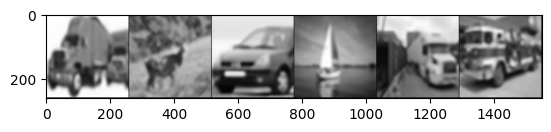

----------------target data------------------------


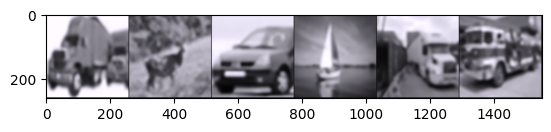

-------------------output data ---------------------


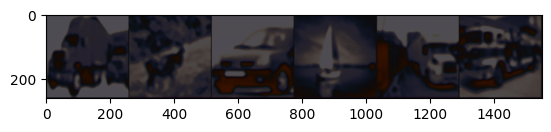

-----------input data-----------------------------


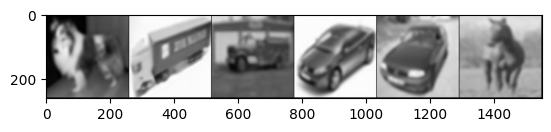

----------------target data------------------------


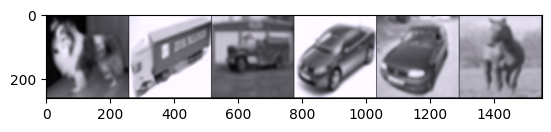

-------------------output data ---------------------


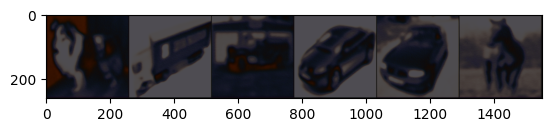

-----------input data-----------------------------


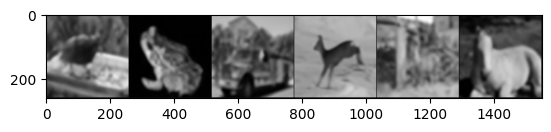

----------------target data------------------------


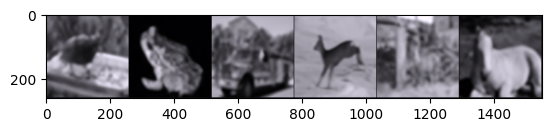

-------------------output data ---------------------


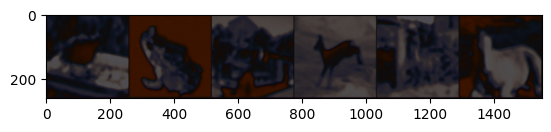

-----------input data-----------------------------


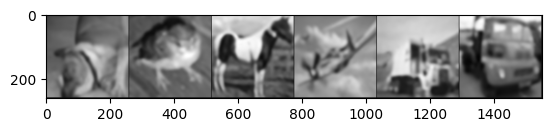

----------------target data------------------------


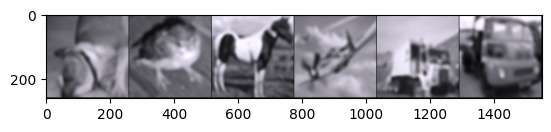

-------------------output data ---------------------


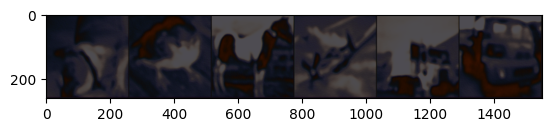

-----------input data-----------------------------


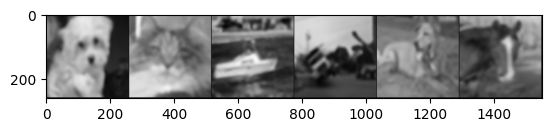

----------------target data------------------------


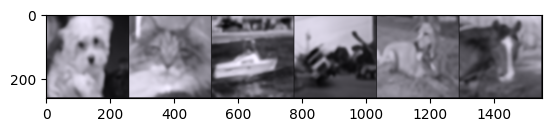

-------------------output data ---------------------


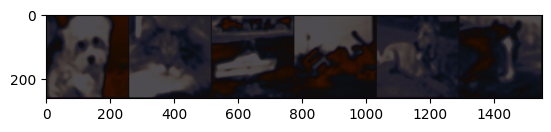

-----------input data-----------------------------


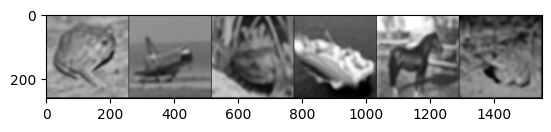

----------------target data------------------------


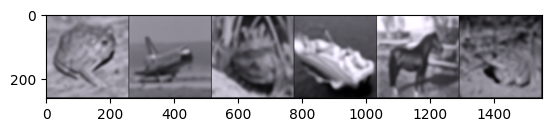

-------------------output data ---------------------


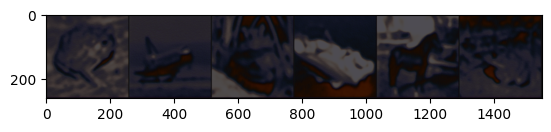

-----------input data-----------------------------


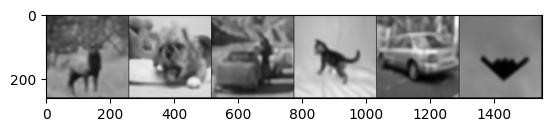

----------------target data------------------------


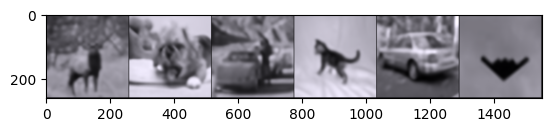

-------------------output data ---------------------


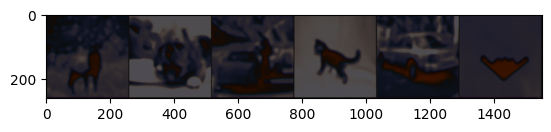

-----------input data-----------------------------


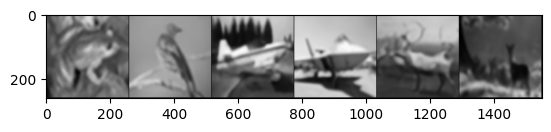

----------------target data------------------------


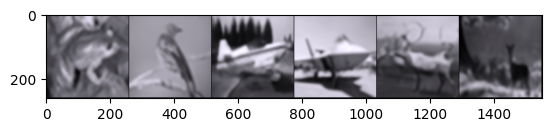

-------------------output data ---------------------


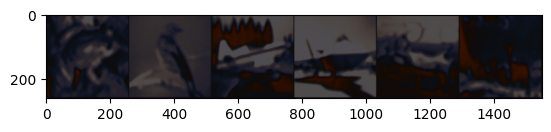

-----------input data-----------------------------


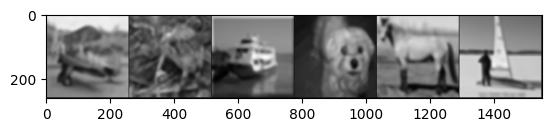

----------------target data------------------------


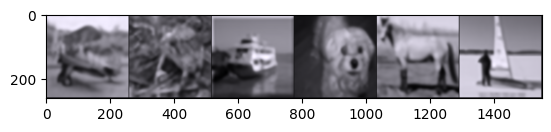

-------------------output data ---------------------


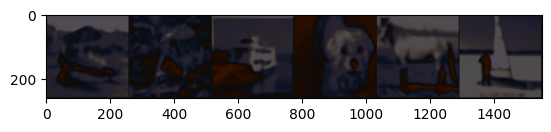

-----------input data-----------------------------


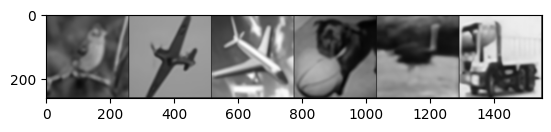

----------------target data------------------------


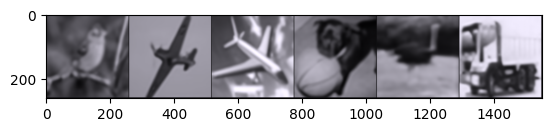

-------------------output data ---------------------


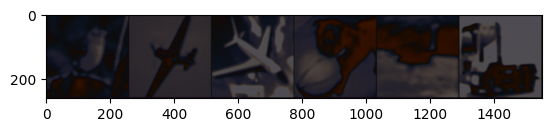

-----------input data-----------------------------


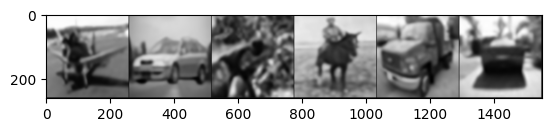

----------------target data------------------------


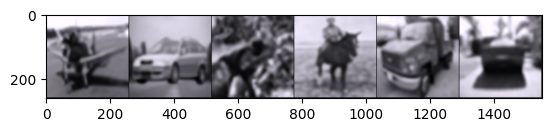

-------------------output data ---------------------


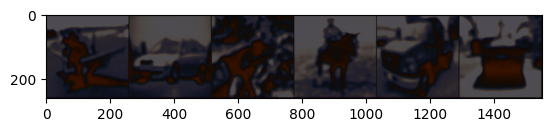

-----------input data-----------------------------


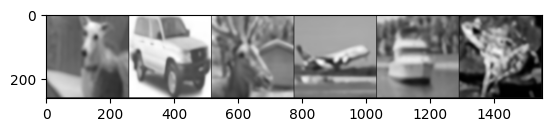

----------------target data------------------------


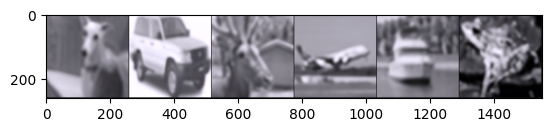

-------------------output data ---------------------


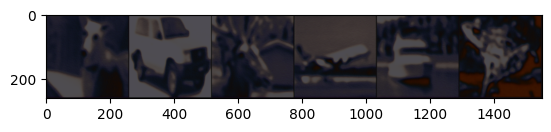

-----------input data-----------------------------


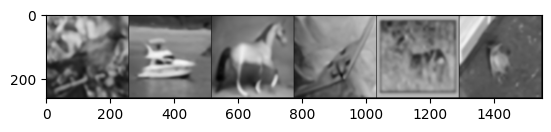

----------------target data------------------------


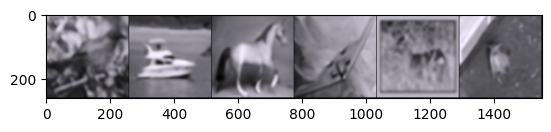

-------------------output data ---------------------


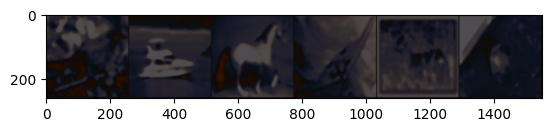

-----------input data-----------------------------


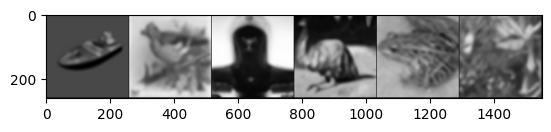

----------------target data------------------------


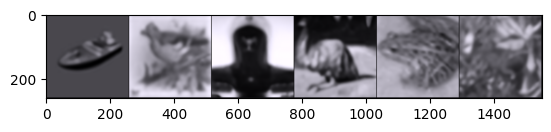

-------------------output data ---------------------


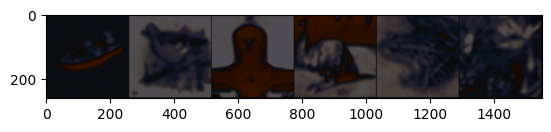

-----------input data-----------------------------


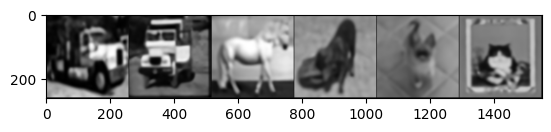

----------------target data------------------------


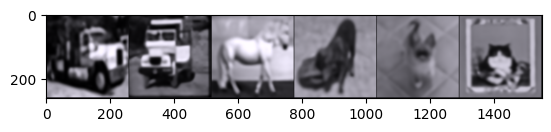

-------------------output data ---------------------


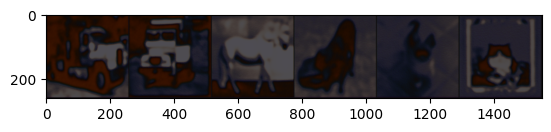

-----------input data-----------------------------


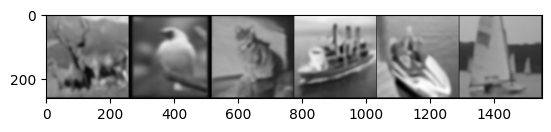

----------------target data------------------------


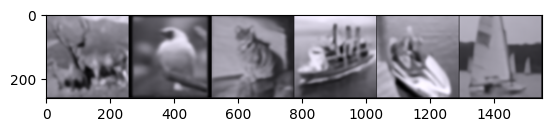

-------------------output data ---------------------


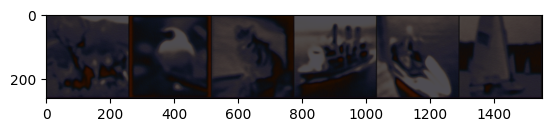

-----------input data-----------------------------


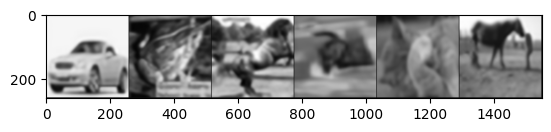

----------------target data------------------------


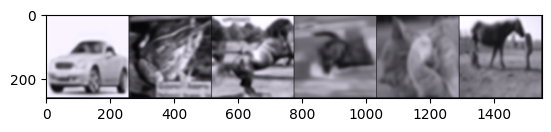

-------------------output data ---------------------


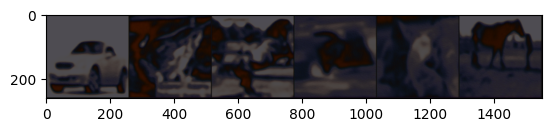

-----------input data-----------------------------


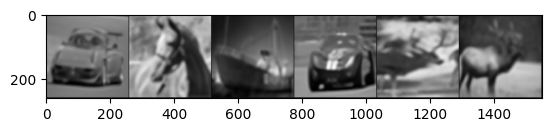

----------------target data------------------------


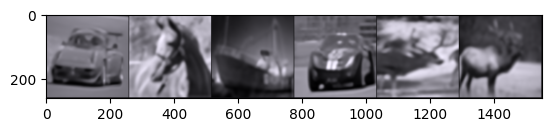

-------------------output data ---------------------


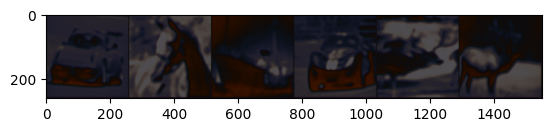

-----------input data-----------------------------


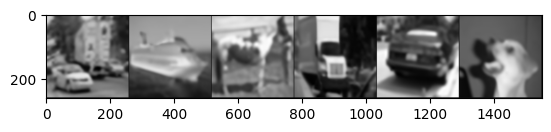

----------------target data------------------------


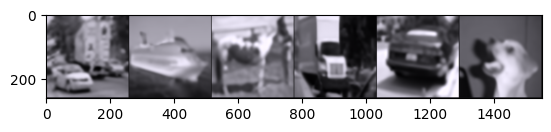

-------------------output data ---------------------


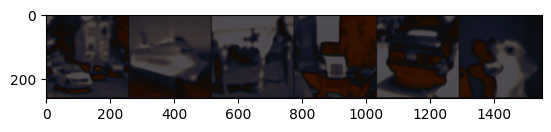

-----------input data-----------------------------


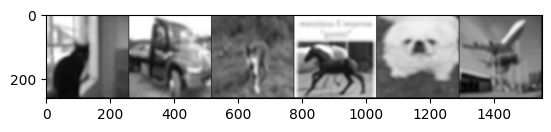

----------------target data------------------------


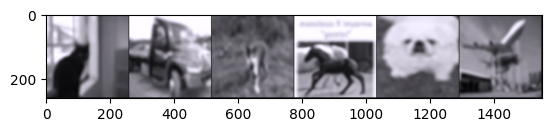

-------------------output data ---------------------


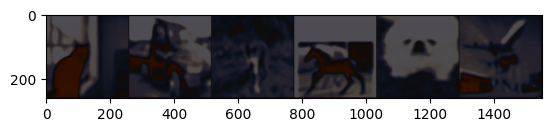

-----------input data-----------------------------


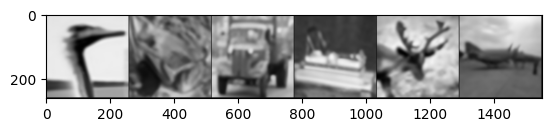

----------------target data------------------------


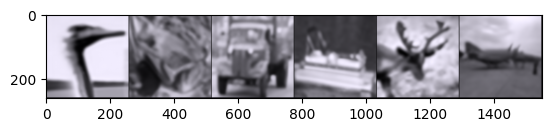

-------------------output data ---------------------


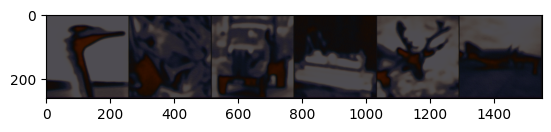

-----------input data-----------------------------


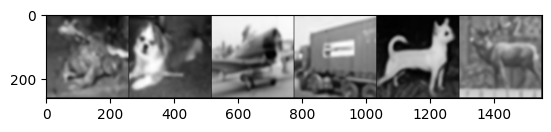

----------------target data------------------------


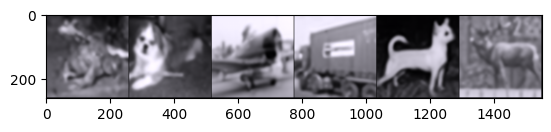

-------------------output data ---------------------


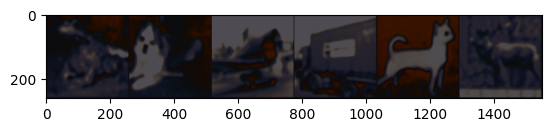

-----------input data-----------------------------


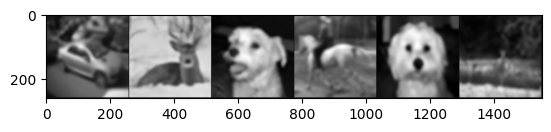

----------------target data------------------------


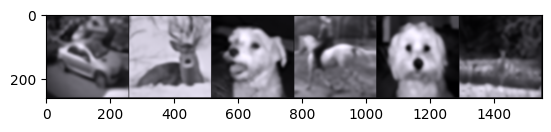

-------------------output data ---------------------


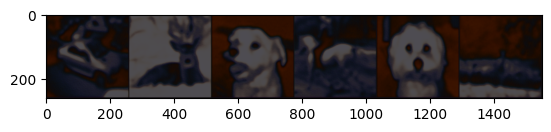

-----------input data-----------------------------


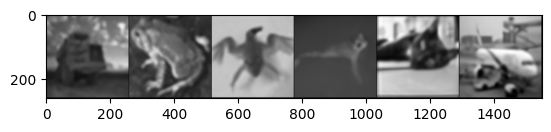

----------------target data------------------------


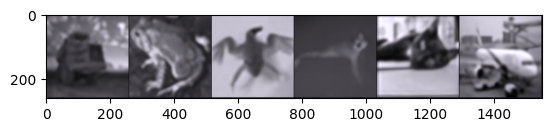

-------------------output data ---------------------


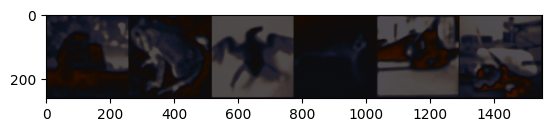

-----------input data-----------------------------


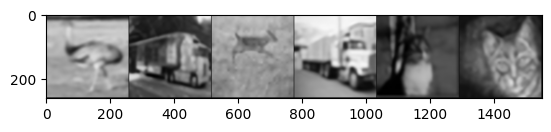

----------------target data------------------------


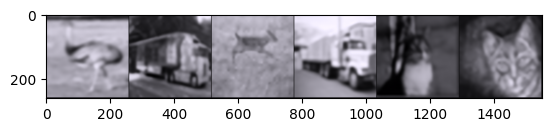

-------------------output data ---------------------


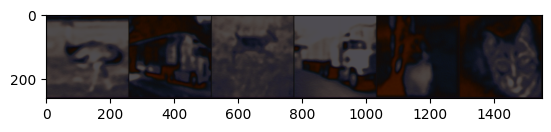

-----------input data-----------------------------


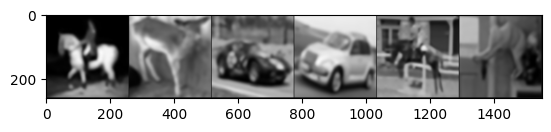

----------------target data------------------------


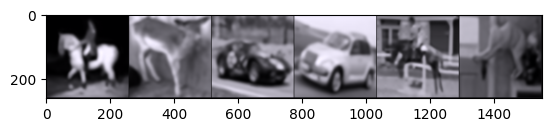

-------------------output data ---------------------


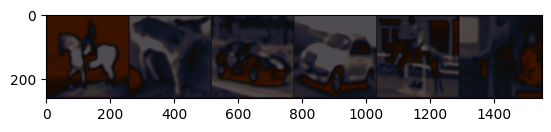

-----------input data-----------------------------


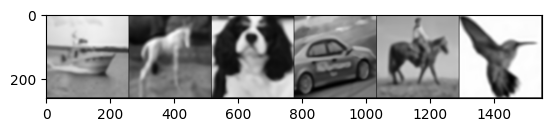

----------------target data------------------------


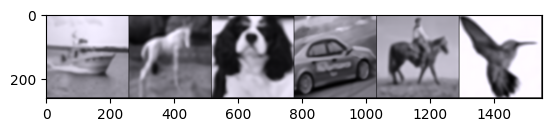

-------------------output data ---------------------


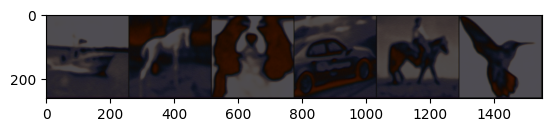

-----------input data-----------------------------


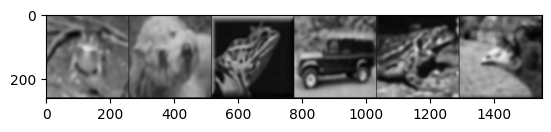

----------------target data------------------------


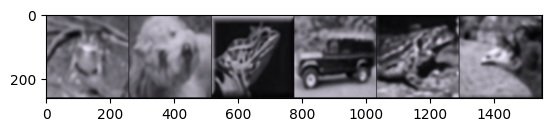

-------------------output data ---------------------


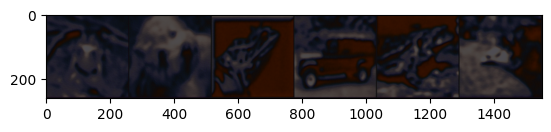

-----------input data-----------------------------


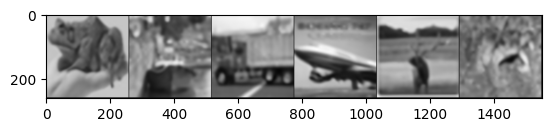

----------------target data------------------------


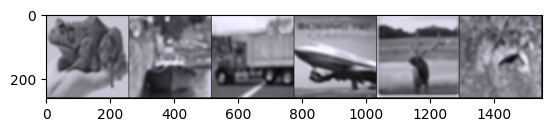

-------------------output data ---------------------


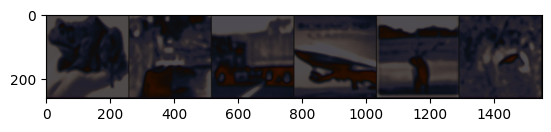

-----------input data-----------------------------


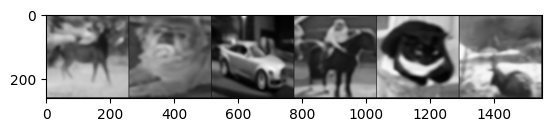

----------------target data------------------------


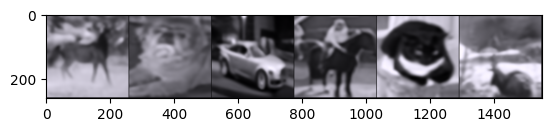

-------------------output data ---------------------


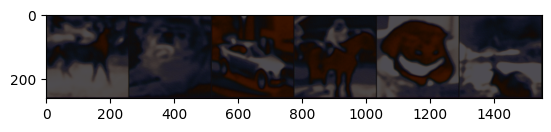

-----------input data-----------------------------


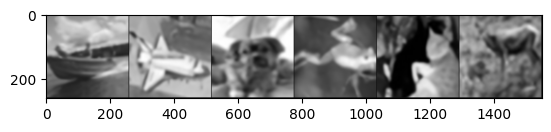

----------------target data------------------------


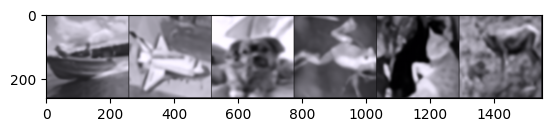

-------------------output data ---------------------


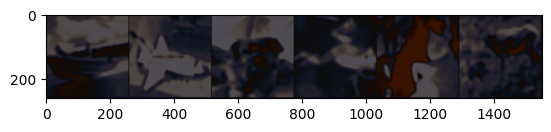

-----------input data-----------------------------


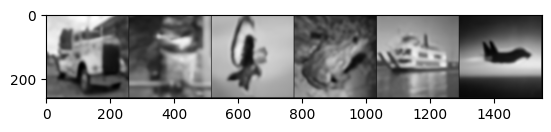

----------------target data------------------------


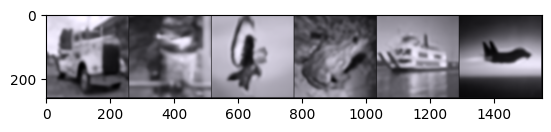

-------------------output data ---------------------


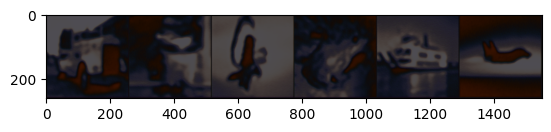

-----------input data-----------------------------


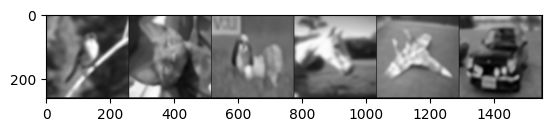

----------------target data------------------------


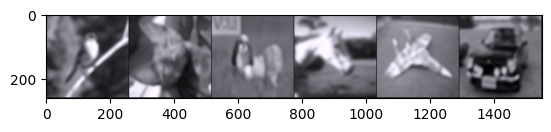

-------------------output data ---------------------


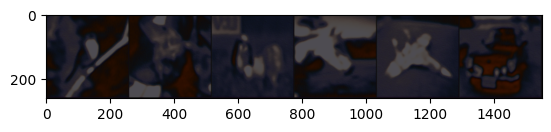

-----------input data-----------------------------


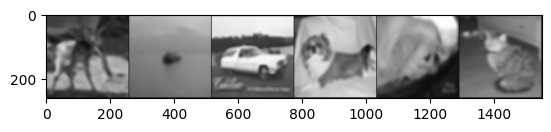

----------------target data------------------------


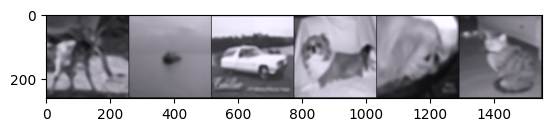

-------------------output data ---------------------


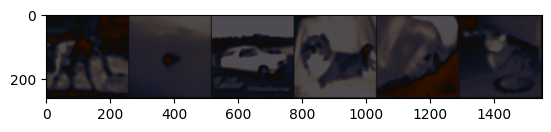

-----------input data-----------------------------


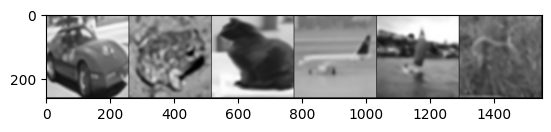

----------------target data------------------------


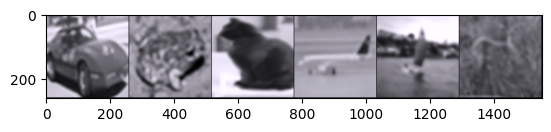

-------------------output data ---------------------


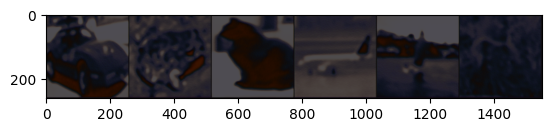

-----------input data-----------------------------


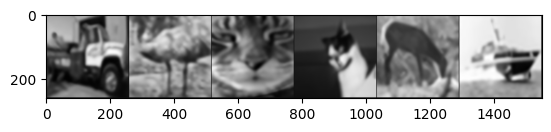

----------------target data------------------------


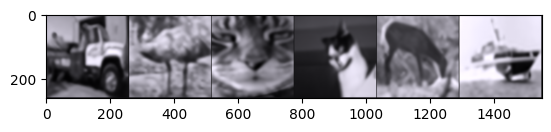

-------------------output data ---------------------


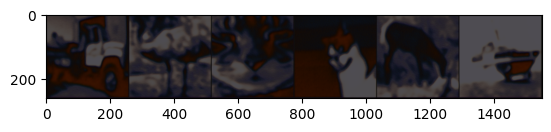

-----------input data-----------------------------


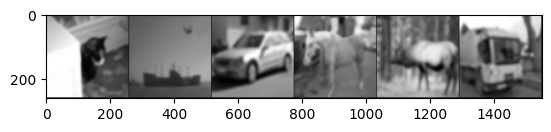

----------------target data------------------------


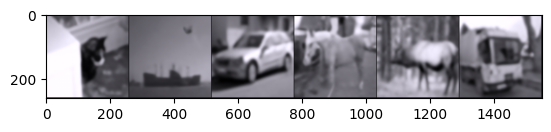

-------------------output data ---------------------


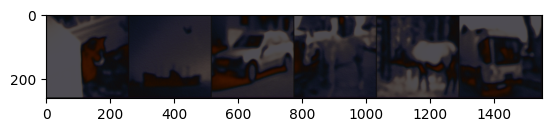

-----------input data-----------------------------


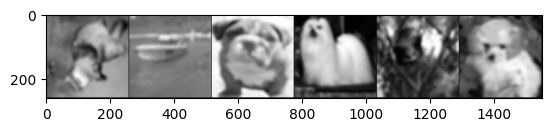

----------------target data------------------------


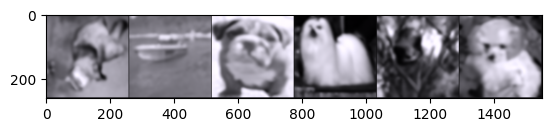

-------------------output data ---------------------


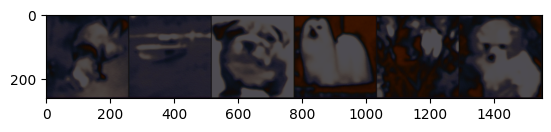

-----------input data-----------------------------


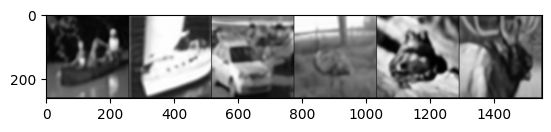

----------------target data------------------------


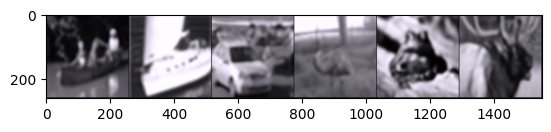

-------------------output data ---------------------


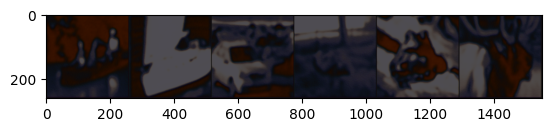

-----------input data-----------------------------


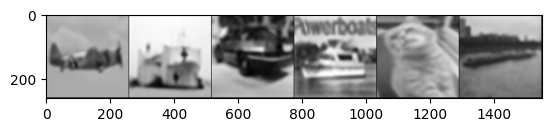

----------------target data------------------------


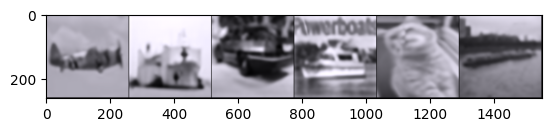

-------------------output data ---------------------


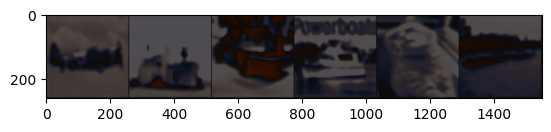

-----------input data-----------------------------


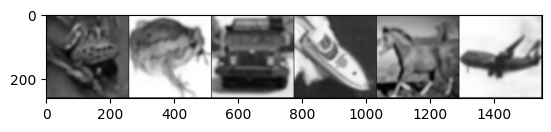

----------------target data------------------------


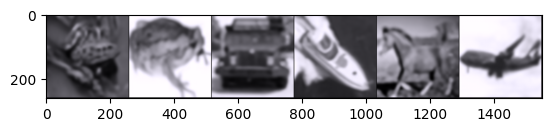

-------------------output data ---------------------


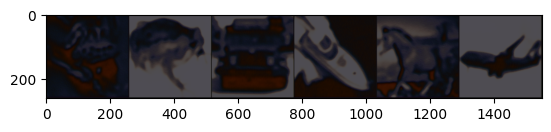

-----------input data-----------------------------


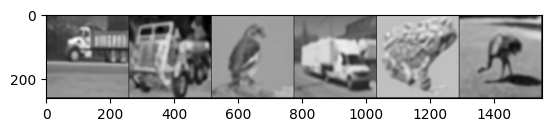

----------------target data------------------------


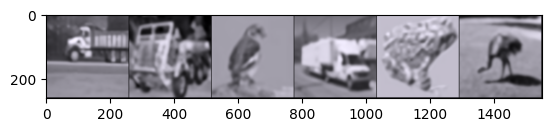

-------------------output data ---------------------


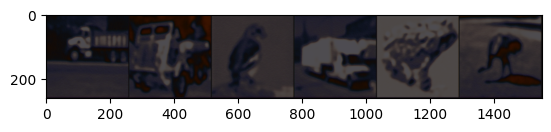

-----------input data-----------------------------


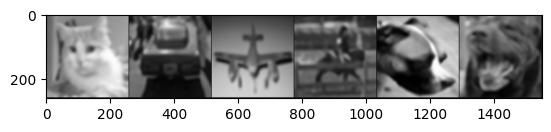

----------------target data------------------------


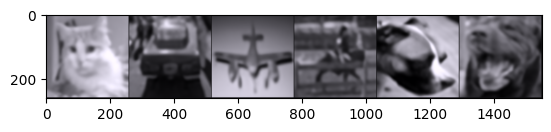

-------------------output data ---------------------


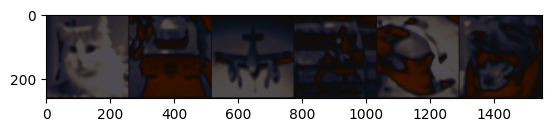

-----------input data-----------------------------


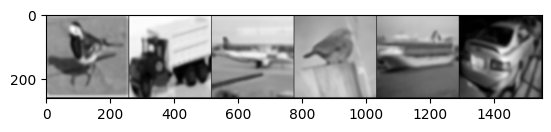

----------------target data------------------------


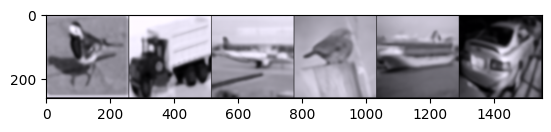

-------------------output data ---------------------


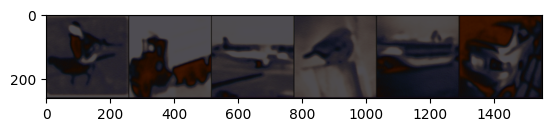

-----------input data-----------------------------


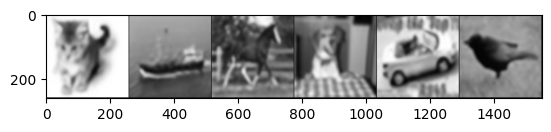

----------------target data------------------------


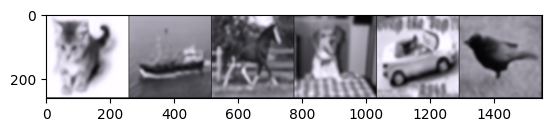

-------------------output data ---------------------


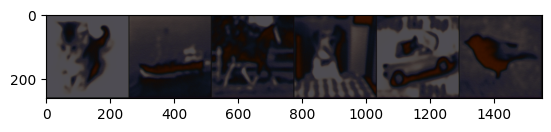

-----------input data-----------------------------


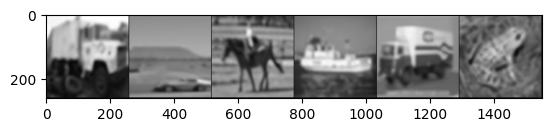

----------------target data------------------------


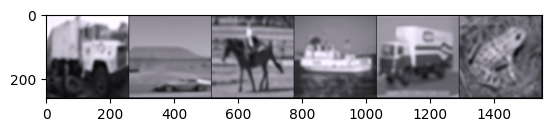

-------------------output data ---------------------


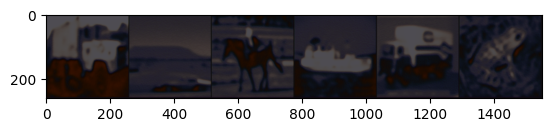

-----------input data-----------------------------


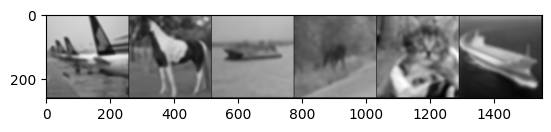

----------------target data------------------------


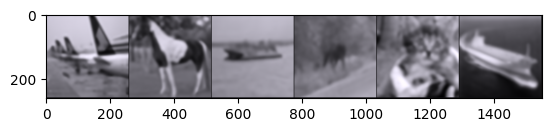

-------------------output data ---------------------


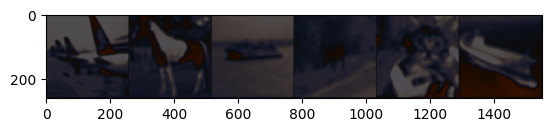

-----------input data-----------------------------


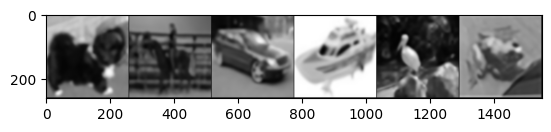

----------------target data------------------------


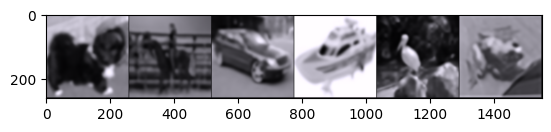

-------------------output data ---------------------


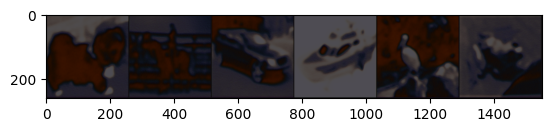

-----------input data-----------------------------


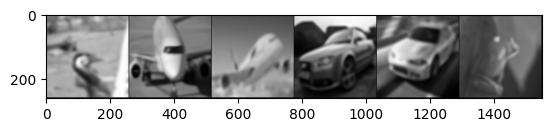

----------------target data------------------------


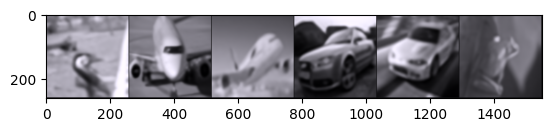

-------------------output data ---------------------


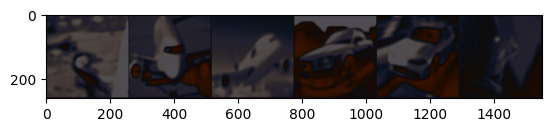

-----------input data-----------------------------


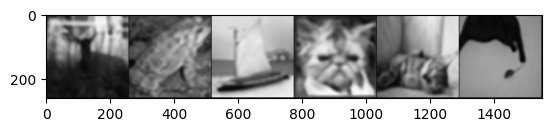

----------------target data------------------------


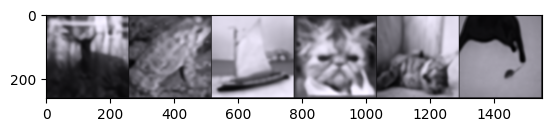

-------------------output data ---------------------


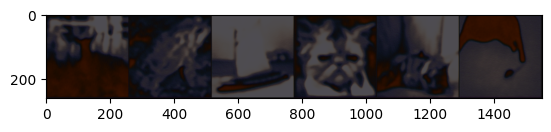

-----------input data-----------------------------


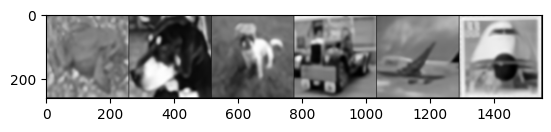

----------------target data------------------------


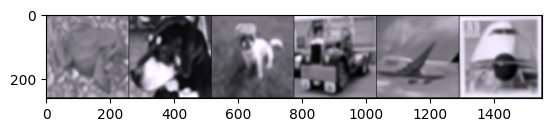

-------------------output data ---------------------


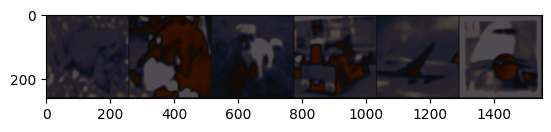

-----------input data-----------------------------


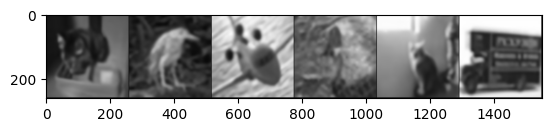

----------------target data------------------------


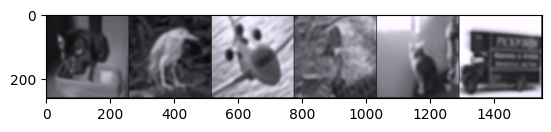

-------------------output data ---------------------


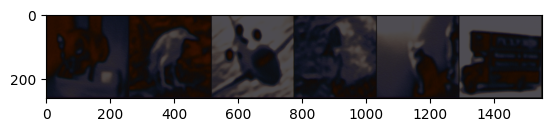

-----------input data-----------------------------


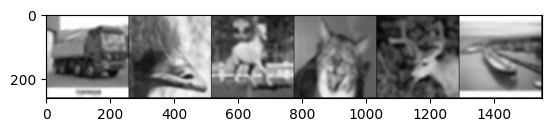

----------------target data------------------------


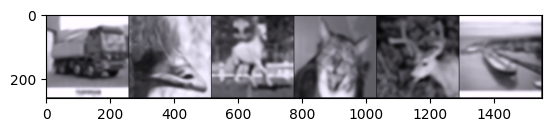

-------------------output data ---------------------


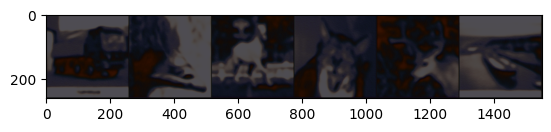

-----------input data-----------------------------


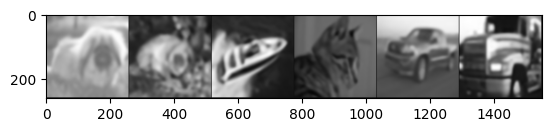

----------------target data------------------------


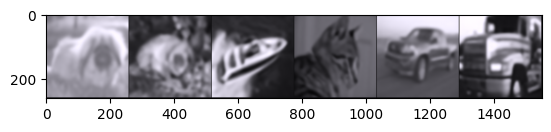

-------------------output data ---------------------


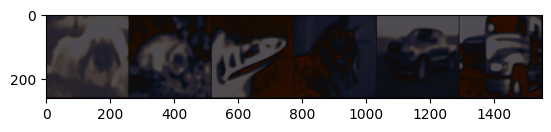

-----------input data-----------------------------


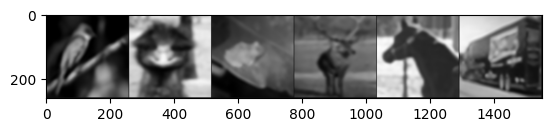

----------------target data------------------------


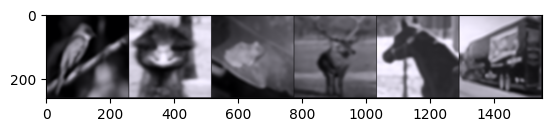

-------------------output data ---------------------


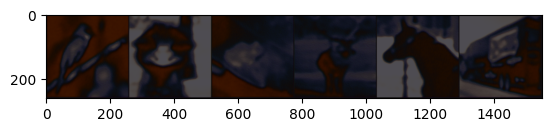

-----------input data-----------------------------


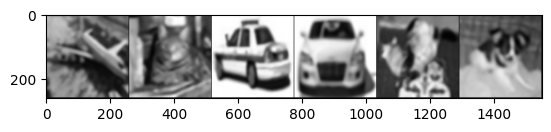

----------------target data------------------------


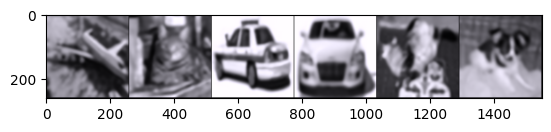

-------------------output data ---------------------


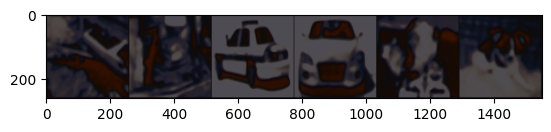

-----------input data-----------------------------


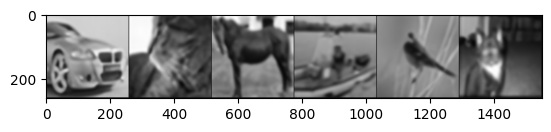

----------------target data------------------------


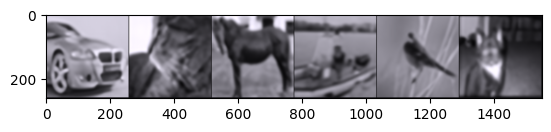

-------------------output data ---------------------


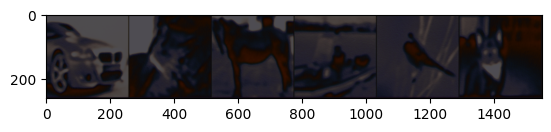

-----------input data-----------------------------


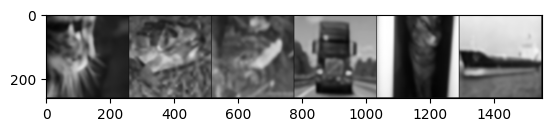

----------------target data------------------------


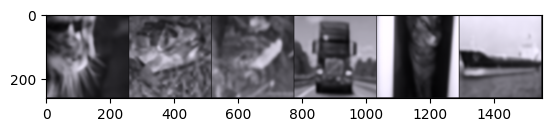

-------------------output data ---------------------


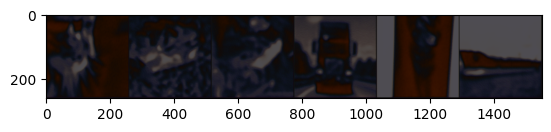

-----------input data-----------------------------


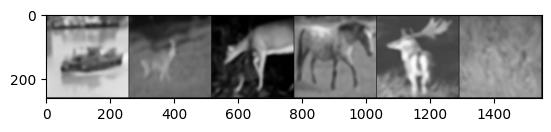

----------------target data------------------------


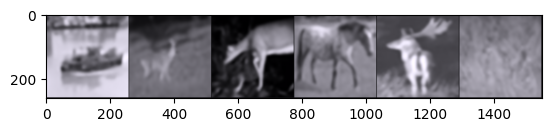

-------------------output data ---------------------


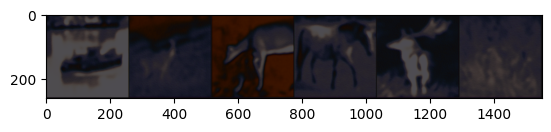

-----------input data-----------------------------


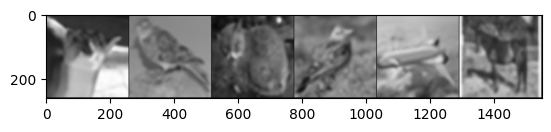

----------------target data------------------------


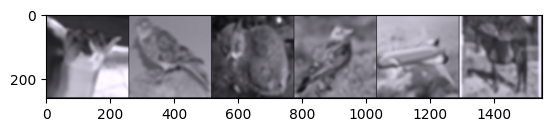

-------------------output data ---------------------


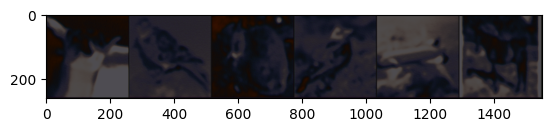

-----------input data-----------------------------


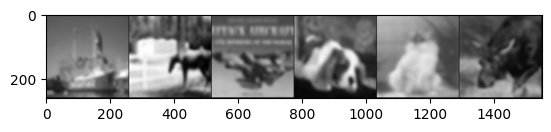

----------------target data------------------------


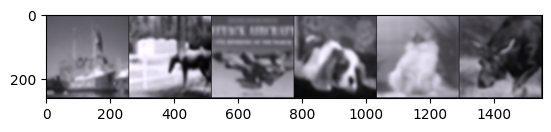

-------------------output data ---------------------


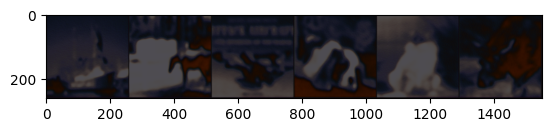

-----------input data-----------------------------


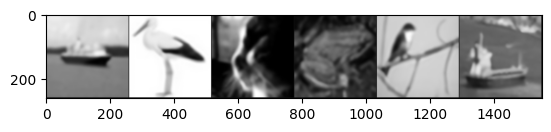

----------------target data------------------------


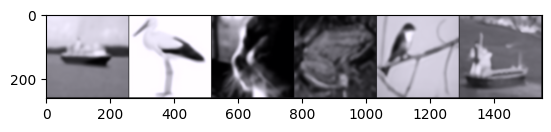

-------------------output data ---------------------


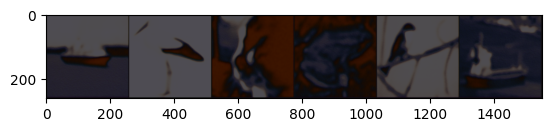

-----------input data-----------------------------


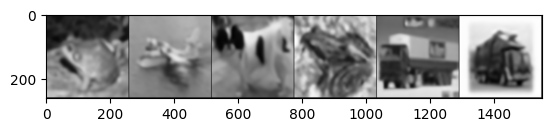

----------------target data------------------------


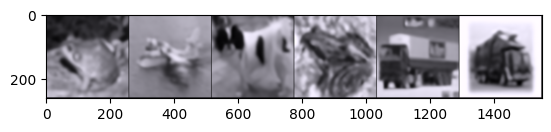

-------------------output data ---------------------


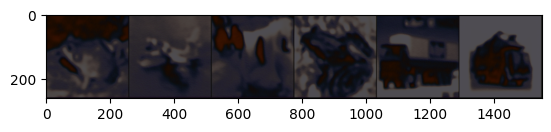

-----------input data-----------------------------


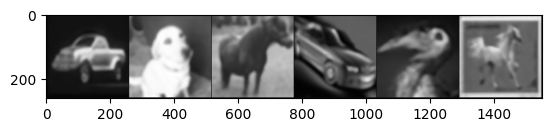

----------------target data------------------------


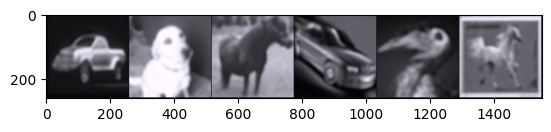

-------------------output data ---------------------


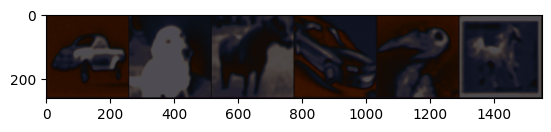

-----------input data-----------------------------


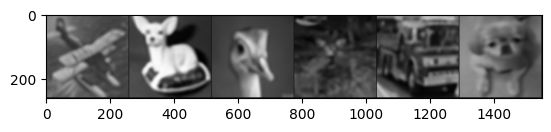

----------------target data------------------------


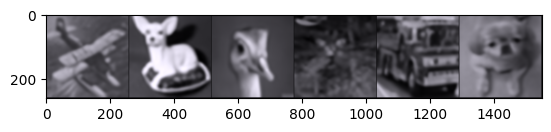

-------------------output data ---------------------


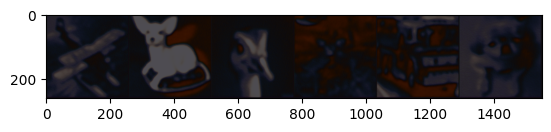

-----------input data-----------------------------


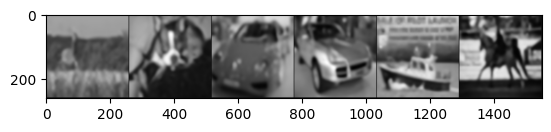

----------------target data------------------------


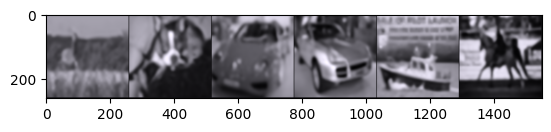

-------------------output data ---------------------


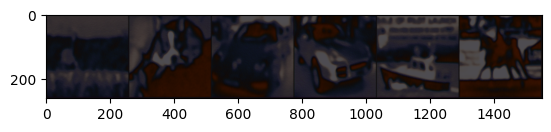

-----------input data-----------------------------


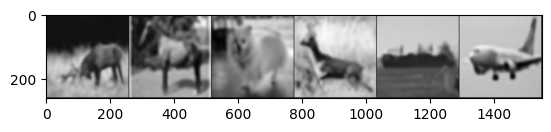

----------------target data------------------------


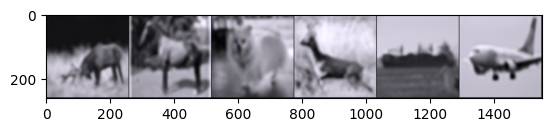

-------------------output data ---------------------


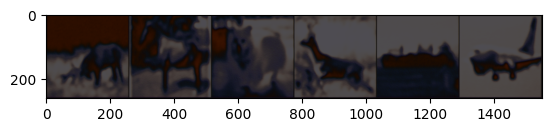

-----------input data-----------------------------


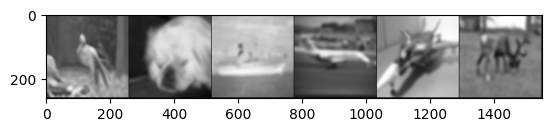

----------------target data------------------------


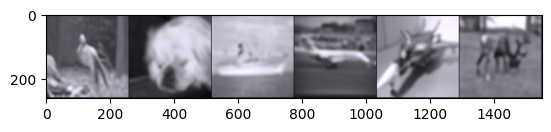

-------------------output data ---------------------


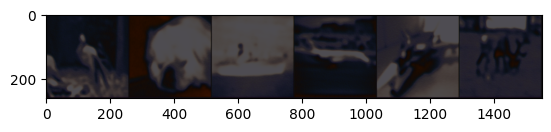

-----------input data-----------------------------


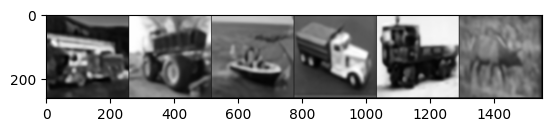

----------------target data------------------------


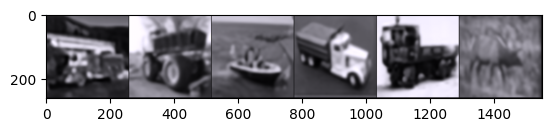

-------------------output data ---------------------


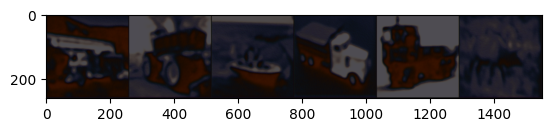

-----------input data-----------------------------


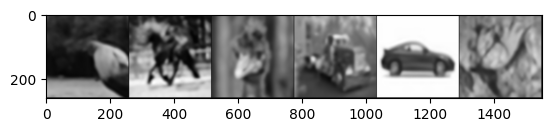

----------------target data------------------------


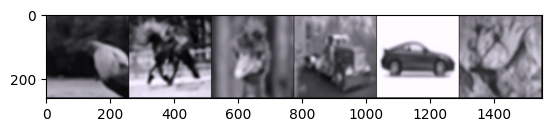

-------------------output data ---------------------


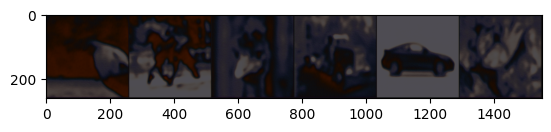

-----------input data-----------------------------


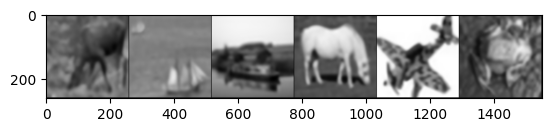

----------------target data------------------------


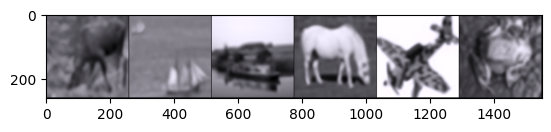

-------------------output data ---------------------


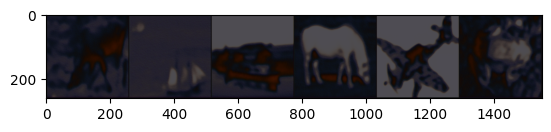

-----------input data-----------------------------


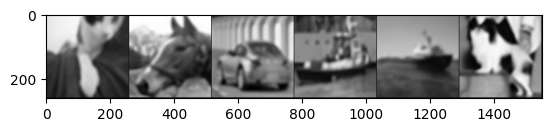

----------------target data------------------------


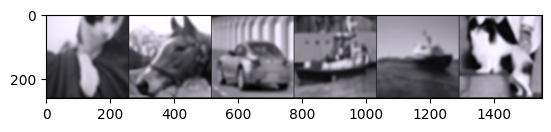

-------------------output data ---------------------


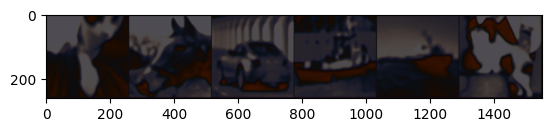

-----------input data-----------------------------


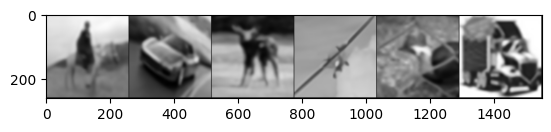

----------------target data------------------------


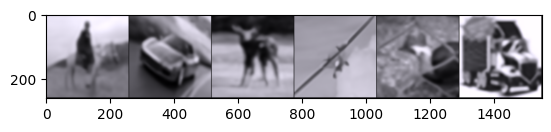

-------------------output data ---------------------


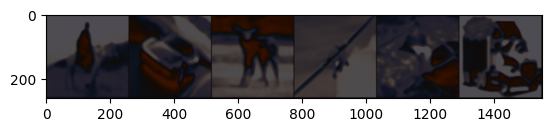

-----------input data-----------------------------


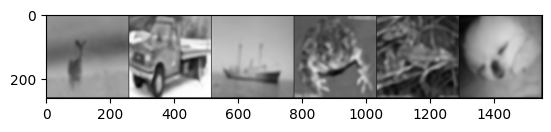

----------------target data------------------------


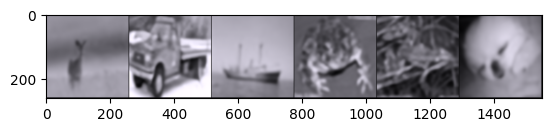

-------------------output data ---------------------


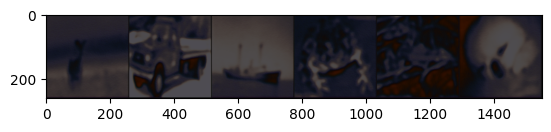

-----------input data-----------------------------


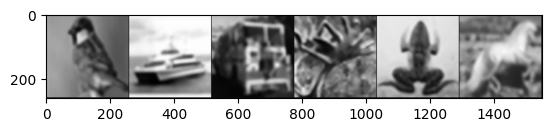

----------------target data------------------------


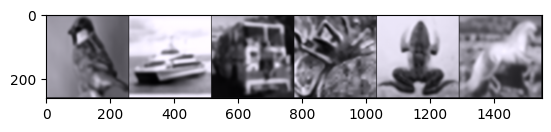

-------------------output data ---------------------


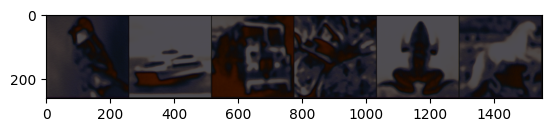

-----------input data-----------------------------


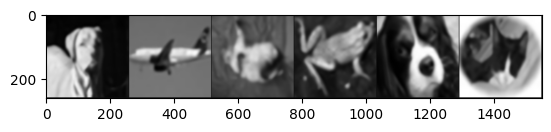

----------------target data------------------------


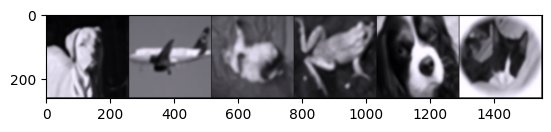

-------------------output data ---------------------


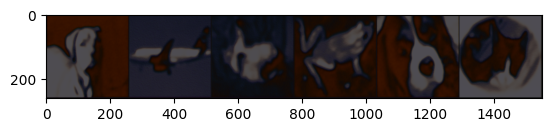

-----------input data-----------------------------


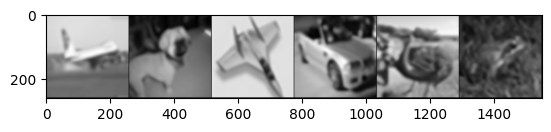

----------------target data------------------------


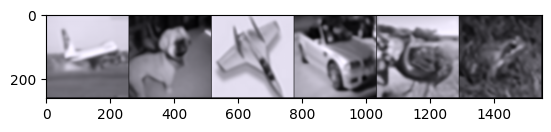

-------------------output data ---------------------


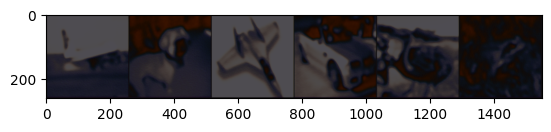

-----------input data-----------------------------


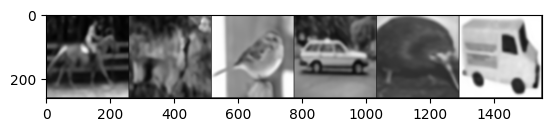

----------------target data------------------------


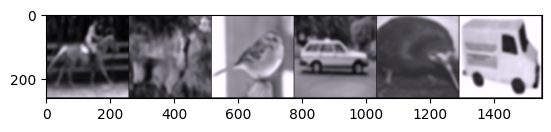

-------------------output data ---------------------


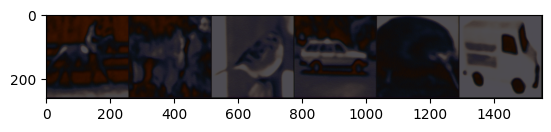

-----------input data-----------------------------


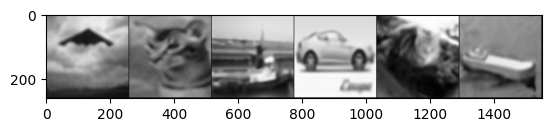

----------------target data------------------------


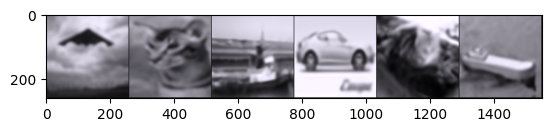

-------------------output data ---------------------


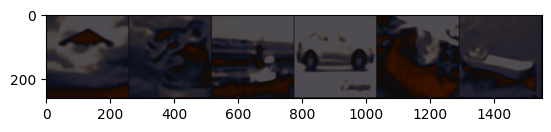

-----------input data-----------------------------


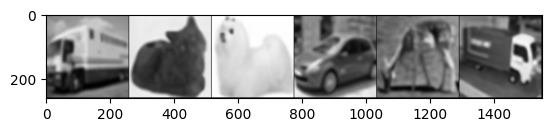

----------------target data------------------------


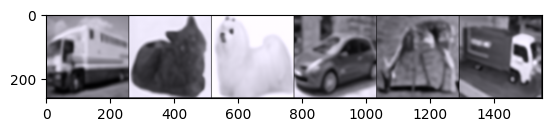

-------------------output data ---------------------


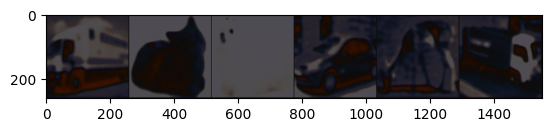

-----------input data-----------------------------


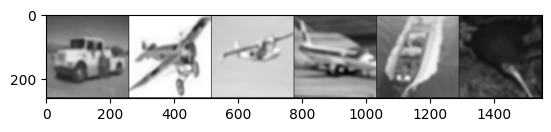

----------------target data------------------------


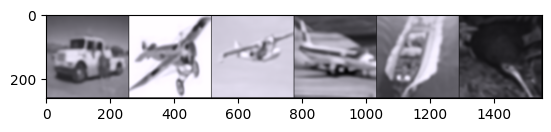

-------------------output data ---------------------


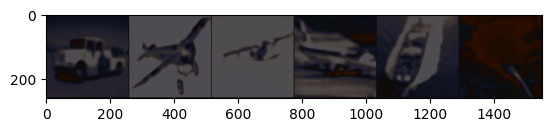

-----------input data-----------------------------


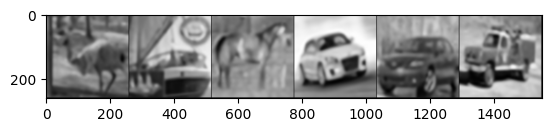

----------------target data------------------------


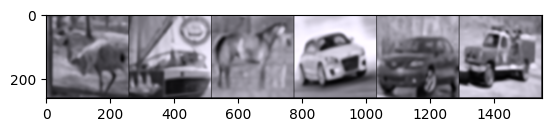

-------------------output data ---------------------


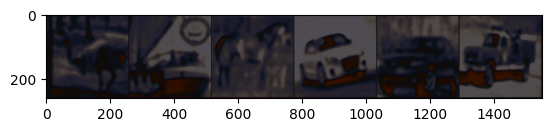

-----------input data-----------------------------


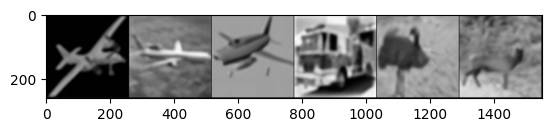

----------------target data------------------------


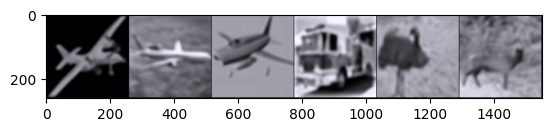

-------------------output data ---------------------


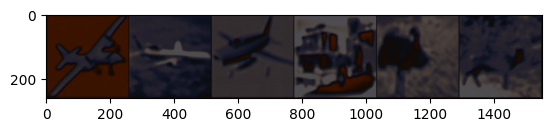

In [63]:
Discri.eval()
Gener.eval()


fixed_noise = torch.randn(test_batch_size, 1, img_height, img_width).uniform_(0.1)

for i, data in enumerate(test_loader, 0):
  images, label = data['A'], data['B']

  if len(data['A']) != test_batch_size:
    continue

  grays = torch.from_numpy(np.resize(images.numpy(), (test_batch_size, 1, img_height, img_width)))
  gray = Variable(torch.cat([grays, fixed_noise], dim = 1).cuda(gpu))

  output = Gener(gray)

  inputs = torchvision.utils.make_grid(grays)
  labels = torchvision.utils.make_grid(label)
  out = torchvision.utils.make_grid(output.data)


  print('-----------input data-----------------------------')
  plt.imshow(reNormalize(inputs.cpu(), gray_mean, gray_std))
  plt.show()

  print('----------------target data------------------------')
  plt.imshow(reNormalize(inputs.cpu(), color_mean, color_std))
  plt.show()

  print('-------------------output data ---------------------')
  plt.imshow(reNormalize(out.cpu(), color_mean, color_std))
  plt.show()

color_mean, color_std
(array([0.06107936, 0.05873202, 0.06731751]),
 array([0.24714239, 0.24234689, 0.25945618]))

 <br>

 gray_mean, gray_std
 (array([0.05931176, 0.05931176, 0.05931176]),
 array([0.24354007, 0.24354007, 0.24354007]))